<br><br><br>

### **ensemble (soft voting)**

In [36]:
import pandas as pd
import numpy as np

In [37]:
import pickle as pkl

def num_to_label(label):
    origin_label = []
    with open('dict_num_to_label.pkl', 'rb') as f:
        dict_num_to_label = pkl.load(f)
    for v in label:
        origin_label.append(dict_num_to_label[v])
    return origin_label

In [38]:
import os

use_files = []
PATH = '/opt/ml/level2_klue_nlp-level2-nlp-01/ensemble/ens_3/'  # root PATH
for idx, file_nm in enumerate(os.listdir(PATH)):
    if 'output_' in file_nm:
        use_files.append(PATH + file_nm)
use_files

['/opt/ml/level2_klue_nlp-level2-nlp-01/ensemble/ens_3/output_현정_BEST.csv',
 '/opt/ml/level2_klue_nlp-level2-nlp-01/ensemble/ens_3/output_용우.csv',
 '/opt/ml/level2_klue_nlp-level2-nlp-01/ensemble/ens_3/output_준원.csv',
 '/opt/ml/level2_klue_nlp-level2-nlp-01/ensemble/ens_3/output_인진.csv']

In [39]:
from typing import *

def ensemble(files: List):
    ensemble_df = pd.DataFrame({
        'id': [i for i in range(7765)],
        'pred_label': ["" for _ in range(7765)],
        'probs': [np.zeros(30,) for _ in range(7765)]
    })

    to_array = lambda s: np.asarray(list(map(float, s[1:-1].replace(' ', '').split(','))))
    for file in files:
        df = pd.read_csv(file)
        ensemble_df['probs'] += df['probs'].map(to_array)    
    
    
    ensemble_df['probs'] = ensemble_df['probs'].map(lambda arr: arr / len(use_files))
    ensemble_df['pred_label'] = num_to_label(ensemble_df['probs'].map(lambda arr: arr.argmax(-1)))
    
    ensemble_df['probs'] = ensemble_df['probs'].map(lambda arr: str(list(arr)))
    return ensemble_df

In [40]:
result = ensemble(use_files)
len(result)

7765

In [41]:
result

,id,pred_label,probs
0,0,org:product,"[0.11498376929642858, 0.006078079046428571, 0...."
1,1,per:alternate_names,"[0.025498172889285714, 0.0019460668225000002, ..."
2,2,no_relation,"[0.9625219439285715, 0.0012719762203571429, 0...."
3,3,no_relation,"[0.8889493685714285, 0.0018829983814285715, 0...."
4,4,no_relation,"[0.584591259, 0.363587971, 0.00163161763642857..."
...,...,...,...
7760,7760,org:place_of_headquarters,"[0.27104622164285713, 0.004271234917857143, 0...."
7761,7761,no_relation,"[0.9498927314285714, 0.0037355257921428573, 0...."
7762,7762,org:top_members/employees,"[0.0009682090196428572, 0.9643376478571428, 0...."
7763,7763,no_relation,"[0.9267397317857142, 0.0009437369624999998, 0...."


In [42]:
result.to_csv('./ens_3/soft_ensemble_3.csv', index=False)

<br><br><br>

### **viz**

In [32]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

In [33]:
value_counts_1 = result['pred_label'].value_counts().sort_values(ascending=True)
pd.DataFrame(value_counts_1)

,pred_label
per:religion,8
org:dissolved,8
org:founded_by,9
per:schools_attended,10
org:political/religious_affiliation,11
per:place_of_death,12
per:place_of_birth,13
per:date_of_birth,13
per:other_family,15
per:date_of_death,19


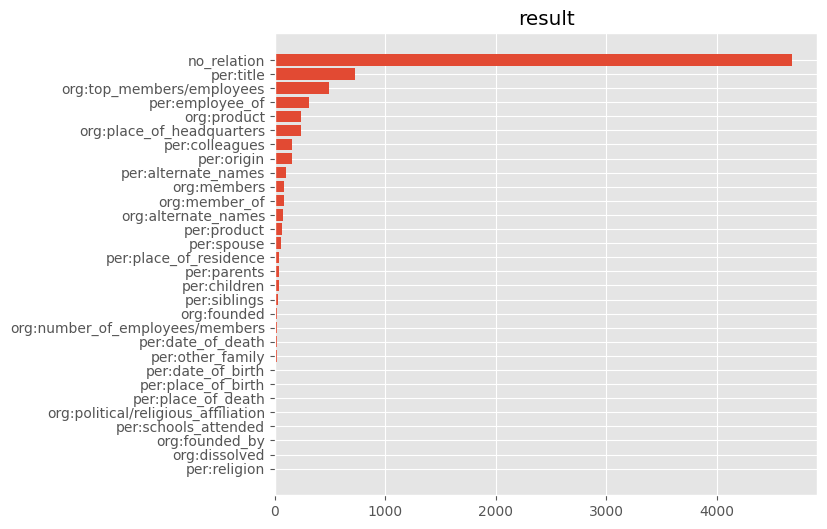

In [34]:

fig, ax = plt.subplots(1, 1, figsize=(7, 6))
ax.set_title('result')
ax.barh(value_counts.index, value_counts)
plt.show()

<br><br><br>

### **ensemble (Hard voting)**

In [35]:
def ensemble(files: List):
    ensemble_df = pd.DataFrame({
        'id': [i for i in range(7765)],
        'pred_label': ["" for _ in range(7765)],
        'probs': [np.zeros((30,)) for _ in range(7765)]
    })

    to_array = lambda s: np.asarray(list(map(float, s[1:-1].replace(' ', '').split(','))))
    for idx, file in enumerate(files):
        df = pd.read_csv(file)
        ensemble_df[f'pred_label_{idx}'] = df['pred_label']
        ensemble_df[f'probs_{idx}'] = df['probs'].map(to_array)

    comp_columns = [column for column in ensemble_df.columns if 'pred_label_' in column]
    for i, item in ensemble_df.iterrows():
        hard_vote =  pd.Series(item[comp_columns]).value_counts().sort_values(ascending=False).index[0]
        hard_vote_idx = [int(k[-1]) for k in item[item==hard_vote].index]
        
        for idx in hard_vote_idx:
            ensemble_df['probs'][i] += ensemble_df[f'probs_{idx}'][i]
        ensemble_df['probs'][i] /= len(hard_vote_idx)
        ensemble_df['pred_label'][i] = ensemble_df['probs'][i].argmax(-1)    
    ensemble_df['pred_label'] = num_to_label(ensemble_df['pred_label'])

    use_columns = ['id', 'pred_label', 'probs']
    ensemble_df = ensemble_df[use_columns]

    return ensemble_df

In [40]:
result = ensemble(use_files)
result


/Users/wooy0ng/miniconda3/envs/venv/lib/python3.9/site-packages/pandas/core/ops/array_ops.py:75: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  result = libops.scalar_compare(x.ravel(), y, op)
/var/folders/xj/8qmq115149l4lrq0qv4w4d1c0000gn/T/ipykernel_6267/4246772339.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ensemble_df['probs'][i] += ensemble_df[f'probs_{idx}'][i]
/var/folders/xj/8qmq115149l4lrq0qv4w4d1c0000gn/T/ipykernel_6267/4246772339.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ensemble_df['probs'][i] /= len(hard_vo

,id,pred_label,probs
0,0,org:product,"[0.019226306666666665, 0.009632747799999999, 0..."
1,1,per:alternate_names,"[0.0169472895, 0.0023015986875, 0.002482622822..."
2,2,no_relation,"[0.95323925, 0.001408610082, 0.0015691875772, ..."
3,3,no_relation,"[0.879475706, 0.001890858428, 0.001906566426, ..."
4,4,no_relation,"[0.7036323233333334, 0.23272288, 0.00156348266..."
...,...,...,...
7760,7760,org:place_of_headquarters,"[0.1038048905, 0.00440991425, 0.00551863655, 0..."
7761,7761,no_relation,"[0.9477327799999999, 0.003396280168, 0.0022114..."
7762,7762,org:top_members/employees,"[0.00128112591, 0.9570293, 0.00146816076179999..."
7763,7763,no_relation,"[0.817376548, 0.0017263248499999999, 0.0024824..."


In [41]:
value_counts = result['pred_label'].value_counts().sort_values(ascending=True)
pd.DataFrame(value_counts)

,pred_label
per:religion,8
org:dissolved,8
org:founded_by,9
per:schools_attended,10
per:place_of_death,11
org:political/religious_affiliation,12
per:place_of_birth,12
per:date_of_birth,13
per:other_family,18
org:number_of_employees/members,19
